## Image Orientation Corrector

In [10]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.mixture import GaussianMixture

def ImageOrientation(img_path):
    # Load the image from the given path
    img = cv.imread(img_path)
    copy_1 = img.copy()

    # Convert the image to grayscale
    gray_1 = cv.cvtColor(copy_1, cv.COLOR_BGR2GRAY)

    # Apply a threshold to the image
    ret, thresh_1 = cv.threshold(gray_1, 20, 255, cv.THRESH_TOZERO)

    # Find the contours of the image
    contours_1, hierarchy = cv.findContours(thresh_1, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

    # Draw the contours on the image
    cv.drawContours(copy_1, contours_1, -1, (0, 255, 0), 5)

    # Sorting the contours by area
    contours_1 = sorted(contours_1, key=cv.contourArea, reverse=True)

    # Printing the area of each contour
    for contour in contours_1:
        print(cv.contourArea(contour))

    # Concatenate the contours into a single contour
    single_contour = np.concatenate(contours_1)

    # Using the single_contour to draw the contour on the image
    cv.drawContours(copy_1, [single_contour], -1, (0, 255, 0), 5)

    # Using bounding rectangle to rotate the image to align properly
    rect = cv.minAreaRect(single_contour)

    box = cv.boxPoints(rect)
    box = np.int64(box)

    cv.drawContours(copy_1, [box], 0, (0, 0, 255), 2)

    # Get the rotation angle and adjust it to ensure the longer side is parallel to the x-axis
    angle = rect[2]
    if rect[1][0] < rect[1][1]:
        angle += 90
    rows, cols = img.shape[:2]
    M = cv.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
    dst = cv.warpAffine(img, M, (cols, rows))

    # Making a copy of the rotated image
    copy_2 = dst.copy()
    copy_3 = dst.copy()
    
    # Drawing the contours on the rotated image copy_2
    gray_2 = cv.cvtColor(copy_2, cv.COLOR_BGR2GRAY)
    ret, thresh_2 = cv.threshold(gray_2, 20, 255, cv.THRESH_TOZERO)
    contours_2, hierarchy = cv.findContours(thresh_2, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    cv.drawContours(copy_2, contours_2, -1, (0, 255, 0), 5)

    # Sorting the contours by area
    contours_2 = sorted(contours_2, key=cv.contourArea, reverse=True)


    # Finding the position of the first contour
    x_1, y_1, w_1, h_1 = cv.boundingRect(contours_2[0])
    print(x_1, y_1)

    # Rotating copy_3 by 180 degrees
    rows, cols = copy_3.shape[:2]
    M = cv.getRotationMatrix2D((cols / 2, rows / 2), 180, 1)
    dst_2 = cv.warpAffine(copy_3, M, (cols, rows))

    # Making a copy of the rotated image
    copy_4 = dst_2.copy()

    # Drawing the contours on the rotated image copy_4
    gray_3 = cv.cvtColor(copy_4, cv.COLOR_BGR2GRAY)
    ret, thresh_3 = cv.threshold(gray_3, 20, 255, cv.THRESH_TOZERO)
    contours_3, hierarchy = cv.findContours(thresh_3, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    cv.drawContours(copy_4, contours_3, -1, (0, 255, 0), 5)

    # Sorting the contours by area
    contours_3 = sorted(contours_3, key=cv.contourArea, reverse=True)

    # Printing the coordinates of the first contour
    x_2, y_2, w_2, h_2 = cv.boundingRect(contours_3[0])
    print(x_2, y_2)

    # Determine the final image orientation
    if x_1 < x_2 and y_1 < y_2:
        final_img = dst
    else:
        final_img = dst_2

    # Returning along with data of the pixel_intensity
    data = final_img[:, :, 0].astype(np.int64)
    
    # Making a copy of the final image
    final_img_copy = final_img.copy()

    return final_img, final_img_copy, data, contours_3



## Center of Mass helper function

In [11]:
def calculate_center_of_mass(contour, data):
    com_x = 0
    com_y = 0
    total_intensity = 0

    for i in range(len(data)):
        for j in range(len(data[i])):
            if cv.pointPolygonTest(contour, (j, i), False) == 1:
                com_x += j * data[i][j]
                com_y += i * data[i][j]
                total_intensity += data[i][j]

    com_x /= total_intensity
    com_y /= total_intensity

    return com_x, com_y

def calculate_center_of_mass_from_points(points, intensities):
    total_intensity = np.sum(intensities)
    if total_intensity == 0:
        print("Warning: Total intensity is zero for the given points.")
        return 0, 0

    com_x = np.sum(points[:, 1] * intensities) / total_intensity
    com_y = np.sum(points[:, 0] * intensities) / total_intensity

    return com_x, com_y


## 3D Plot helper function for debuggin

In [12]:
def plot_3d_surface(data, contours=None, contour=None, title='Interactive 3D Plot of Pixel Intensities', markers=[]):
    # Create a mask to highlight the contour areas
    mask = np.zeros_like(data, dtype=np.uint8)
    
    if contours is not None and len(contours) > 0:
        for cnt in contours:
            cv.drawContours(mask, [cnt], -1, (255), thickness=cv.FILLED)
    elif contour is not None:
        cv.drawContours(mask, [contour], -1, (255), thickness=cv.FILLED)

    # Apply the mask to the data
    masked_data = np.where(mask == 255, data, 0)

    # Create the surface plot
    fig = go.Figure(data=[go.Surface(z=masked_data)])

    # Add additional markers
    for marker in markers:
        fig.add_trace(go.Scatter3d(
            x=[marker['x']],
            y=[marker['y']],
            z=[np.max(masked_data)],  # Add a constant offset to ensure markers are visible
            mode='markers',
            marker=dict(
                size=4,
                color=marker['color']
            ),
            name=marker['name']
        ))

    # Update layout for better visualization
    fig.update_layout(
        scene=dict(
            xaxis_title='X Label',
            yaxis_title='Y Label',
            zaxis_title='Z Label',
            aspectratio=dict(x=1, y=1, z=0.5),
            aspectmode='manual'
        ),
        title=title
    )

    fig.show()

# Fiduciary Marker Identifier with threshold

In [13]:
def marker_finder (img, data, threshold = 70) :
    
    # Convert the image to grayscale
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    
    # Apply a threshold to the image using adaptive guassian thresholding
    ret, thresh = cv.threshold(gray, threshold, 255, cv.THRESH_TOZERO)
    
    # Find the contours of the image
    contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    
    # Draw the contours on the image
    cv.drawContours(img, contours, -1, (0, 255, 0), 2)
    
    #finding the center of mass of each contour
    com_markers = []    
    for contour in contours:
        com_markers.append(calculate_center_of_mass(contour, data))
        
    #draw the center of mass on the image
    for com in com_markers:
        cv.circle(img, (int(com[0]), int(com[1])), 3, (255, 0, 0), -1)

    
    return com_markers, contours, img


## Finding the marker near the robot ( Left most marker with second least y value)

In [14]:
def find_leftmost_second_least_y(contours):
    if len(contours) < 2:
        return None  # Not enough contours to have a second least y-value
    
    # Calculate the bounding rectangles and extract y-values
    bounding_rects = [cv.boundingRect(contour) for contour in contours]
    y_values = [rect[1] for rect in bounding_rects]
    
    # Find the unique y-values and sort them
    unique_y_values = sorted(set(y_values))
    
    if len(unique_y_values) < 2:
        return None  # Not enough unique y-values to have a second least
    
    # Get the second least y-value
    second_least_y = unique_y_values[1]
    
    # Find the leftmost contour with the second least y-value
    leftmost_contour = min(
        [contour for rect, contour in zip(bounding_rects, contours) if rect[1] == second_least_y],
        key=lambda contour: cv.boundingRect(contour)[0]
    )
    
    return leftmost_contour

## Robot Finder

In [15]:
def apply_gmm_to_contour(final_img, contour, n_components=2):
    # Create a mask for the contour
    mask = np.zeros(final_img.shape[:2], dtype=np.uint8)  # Ensure mask is single-channel and uint8

    # Draw the contour on the mask
    cv.drawContours(mask, [contour], -1, 255, -1)

    # Get the points within the contour
    points = np.argwhere(mask == 255)
    z_values = final_img[mask == 255, 0]  # Extract the first channel if final_img is a 3-channel image
    
    # Create the data for GMM
    data = np.column_stack((points, z_values))
    
    # Fit GMM to split into two peaks
    gmm = GaussianMixture(n_components=n_components)
    gmm.fit(data)
    
    # Predict the cluster for each point
    labels = gmm.predict(data)
    
    # Separate the data into clusters
    clusters = [data[labels == i] for i in range(n_components)]

    # Plot the 3D surface of the clusters using Plotly
    fig = go.Figure()

    for i, cluster in enumerate(clusters):
        cluster_mask = np.zeros(final_img.shape[:2], dtype=np.uint8)
        cluster_mask[points[labels == i][:, 0], points[labels == i][:, 1]] = z_values[labels == i]
        fig.add_trace(go.Surface(z=cluster_mask, colorscale='Viridis', name=f'Cluster {i+1}'))

    fig.update_layout(
        title='Interactive 3D Plot of GMM Clustering of Contour Points',
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Pixel Intensity (Z)'
        )
    )

    fig.show()
    
    # Calculate the center of mass for each cluster
    centers_of_mass = []
    for i, cluster in enumerate(clusters):
        cluster_points = points[labels == i]
        cluster_intensities = z_values[labels == i]
        com_x, com_y = calculate_center_of_mass_from_points(cluster_points, cluster_intensities)
        centers_of_mass.append((com_x, com_y))
        
        # Draw the center of mass on the image if total intensity is not zero
        if com_x != 0 or com_y != 0:
            cv.circle(final_img, (int(com_x), int(com_y)), 5, (255, 0, 0), -1)

    return contour, centers_of_mass


## Testing / Debuggin

10484.0
8620.5
3163.5
3040.0
91 224
210 382


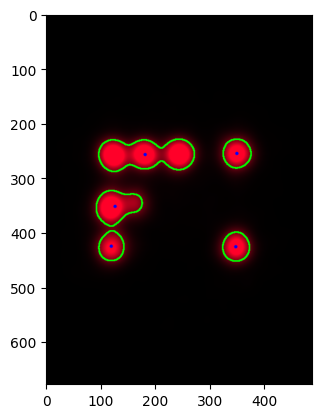

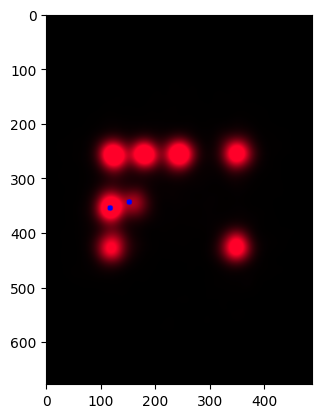

In [17]:
img_path = '/workspaces/CSDNA.worktrees/Master/Testing code/Robot Movement/Data/v8_t=0_avg.png'

final_img, final_img_copy, data, contours = ImageOrientation(img_path)

# Find the markers in the image
com_markers, contours, img = marker_finder(final_img_copy, data, 34)

# Display the image with the markers using plt 
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.show()

# Find the leftmost contour with the second least y-value
leftmost_contour = find_leftmost_second_least_y(contours)

# Apply GMM to the leftmost contour and find centers of mass
leftmost_contour, centers_of_mass = apply_gmm_to_contour(final_img, leftmost_contour, n_components=2)

# Display the image with the centers of mass
plt.imshow(cv.cvtColor(final_img, cv.COLOR_BGR2RGB))
plt.show()

# Display the 3D surface plot of the GMM clustering
plot_3d_surface(data, contour=leftmost_contour, markers=[{'x': com[0], 'y': com[1], 'color': 'red', 'name': f'Center of Mass {i+1}'} for i, com in enumerate(centers_of_mass)], title='Interactive 3D Plot of GMM Clustering of Contour Points')
